## Main Dataframe EDA
* read in pickle

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import textacy
import re
import nltk
import gensim

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# NLP Using a count vectorizer.
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.feature_extraction import DictVectorizer

from collections import Counter

plt.style.use('ggplot')

# extend limit of number of rows and columns to display in cell
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100


Bad key "text.kerning_factor" on line 4 in
/Users/Steven/opt/anaconda3/envs/textacy/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [4]:
import pickle
import os

In [5]:
in_full_path = '../../../../Documents/murakami/pkl3/df_all_v01.pkl'
# read back pickle
with open (in_full_path, 'rb') as fp:
    df = pickle.load(fp)

### Basic dataframe checks

In [6]:
df.head(3)

,book_chunk_no,number,title,text,fstop_indices,split_indices,chunks,translator,book_title,parsed,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
0,0,1,Wednesday Afternoon Picnic,IT WAS A short one-paragraph item in the morn...,"[57, 97, 115, 196, 318, 385, 420, 445, 504, 65...","[967, 1924, 2998, 3982, 4935, 5975, 6995, 7961...",IT WAS A short one-paragraph item in the morni...,Alfred Birnbaum,A Wild Sheep Chase,"(IT, WAS, A, short, one, -, paragraph, item, i...",15,174,742,240,116,33,128,17,0,944,15.889831,184.322034,786.016949,254.237288,122.881356,34.957627,135.593220,18.008475,-0.4798,0.075,0.862,0.064,18.0,20.0,31.0,9.0,2.0,33.0,51.0,19.0,6.0,3.0,5.0,5.0,3.0,2.0,0.0,0.0,0.0,0.0,19.067797,21.186441,32.838983,9.533898,2.118644,34.957627,54.025424,20.127119,6.355932,3.177966,5.296610,5.296610,3.177966,2.118644,0.000000,0.0,0.0,0.0
1,1,1,Wednesday Afternoon Picnic,IT WAS A short one-paragraph item in the morn...,"[57, 97, 115, 196, 318, 385, 420, 445, 504, 65...","[967, 1924, 2998, 3982, 4935, 5975, 6995, 7961...",I got off near the end of the line. The map p...,Alfred Birnbaum,A Wild Sheep Chase,"( , I, got, off, near, the, end, of, the, line...",15,176,734,229,118,29,132,9,0,935,16.042781,188.235294,785.026738,244.919786,126.203209,31.016043,141.176471,9.625668,-0.7902,0.079,0.891,0.030,17.0,22.0,25.0,13.0,5.0,29.0,42.0,22.0,5.0,2.0,12.0,12.0,0.0,0.0,1.0,0.0,0.0,0.0,18.181818,23.529412,26.737968,13.903743,5.347594,31.016043,44.919786,23.529412,5.347594,2.139037,12.834225,12.834225,0.000000,0.000000,1.069519,0.0,0.0,0.0
2,2,1,Wednesday Afternoon Picnic,IT WAS A short one-paragraph item in the morn...,"[57, 97, 115, 196, 318, 385, 420, 445, 504, 65...","[967, 1924, 2998, 3982, 4935, 5975, 6995, 7961...",There was a small coffee shop near the univer...,Alfred Birnbaum,A Wild Sheep Chase,"( , There, was, a, small, coffee, shop, near, ...",13,195,834,250,119,29,150,9,0,1057,12.298959,184.484390,789.025544,236.518448,112.582781,27.436140,141.911069,8.514664,0.4215,0.066,0.840,0.094,18.0,26.0,28.0,14.0,1.0,35.0,38.0,19.0,6.0,6.0,11.0,11.0,4.0,13.0,1.0,0.0,0.0,0.0,17.029328,24.597919,26.490066,13.245033,0.946074,33.112583,35.950804,17.975402,5.676443,5.676443,10.406812,10.406812,3.784295,12.298959,0.946074,0.0,0.0,0.0


In [80]:
df_wsc = df[df['book_title'] == 'A Wild Sheep Chase']

In [86]:
df_wsc.sort_values(by='n_sents', ascending=False)

,book_chunk_no,number,title,text,fstop_indices,split_indices,chunks,translator,book_title,parsed,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
19,19,2,Sixteen Steps,I WAITED FOR the compressed-air hiss of the e...,"[101, 215, 252, 271, 338, 413, 468, 625, 706, ...","[965, 1976, 2982, 3963, 4966, 5989, 6994, 7905...","“Very well,” she picked up where I trailed of...",Alfred Birnbaum,A Wild Sheep Chase,"( , “, Very, well, ,, ”, she, picked, up, wher...",36,205,751,231,119,17,182,3,0,1029,34.985423,199.222546,729.834791,224.489796,115.646259,16.520894,176.870748,2.915452,0.7941,0.024,0.922,0.054,40.0,39.0,22.0,6.0,0.0,88.0,25.0,18.0,2.0,2.0,20.0,12.0,12.0,0.0,1.0,6.0,0.0,0.0,38.872692,37.900875,21.379981,5.830904,0.000000,85.519922,24.295432,17.492711,1.943635,1.943635,19.436346,11.661808,11.661808,0.000000,0.971817,5.830904,0.0,0.000000
420,420,36,The Winds’ Own Private Thoroughfare,THREE UNEVENTFUL DAYS passed. Not one thing ...,"[29, 54, 82, 185, 242, 429, 501, 536, 564, 637...","[997, 1997, 2955, 3973, 4952, 5954, 6988, 7904...",“Youwon’ttellanyone?” “I won’t tell anyone.” ...,Alfred Birnbaum,A Wild Sheep Chase,"( , “, Youwon’ttellanyone, ?, ”, “, I, wo, n’t...",34,135,745,213,92,29,106,17,0,957,35.527691,141.065831,778.474399,222.570533,96.133751,30.303030,110.762800,17.763845,0.6199,0.046,0.877,0.076,21.0,26.0,16.0,5.0,0.0,86.0,13.0,13.0,0.0,0.0,2.0,2.0,7.0,24.0,1.0,5.0,0.0,1.0,21.943574,27.168234,16.718913,5.224660,0.000000,89.864159,13.584117,13.584117,0.000000,0.000000,2.089864,2.089864,7.314525,25.078370,1.044932,5.224660,0.0,1.044932
277,277,27,"The Sheep Professor Eats All, Tells All","ACCORDING TO HIS Dolphin Hotel-owner son, the...","[95, 194, 259, 278, 352, 425, 501, 607, 632, 7...","[965, 1956, 2936, 3962, 4915, 5952, 6976, 7989...",Q: Are you telling me that during the week of...,Alfred Birnbaum,A Wild Sheep Chase,"( , Q, :, Are, you, telling, me, that, during,...",31,168,801,263,92,42,116,28,0,1005,30.845771,167.164179,797.014925,261.691542,91.542289,41.791045,115.422886,27.860697,0.7941,0.037,0.899,0.065,15.0,15.0,26.0,11.0,1.0,38.0,38.0,16.0,0.0,5.0,4.0,16.0,7.0,14.0,1.0,0.0,0.0,0.0,14.925373,14.925373,25.870647,10.945274,0.995025,37.810945,37.810945,15.920398,0.000000,4.975124,3.980100,15.920398,6.965174,13.930348,0.995025,0.000000,0.0,0.000000
469,469,EPILOGUE,"“ IT’S ALL OVER ,” said the Sheep Professor, “...",“Over and done.” \n “I suppose I should thank ...,"[14, 48, 95, 153, 177, 202, 289, 418, 492, 534...","[929, 1984, 2996, 3928, 4974, 5948]",I pulled the check out of my pocket and passe...,Alfred Birnbaum,A Wild Sheep Chase,"( , I, pulled, the, check, out, of, my, pocket...",30,206,723,239,112,13,185,10,0,997,30.090271,206.619860,725.175527,239.719157,112.337011,13.039117,185.556670,10.030090,0.9085,0.039,0.878,0.083,33.0,34.0,23.0,13.0,1.0,74.0,32.0,24.0,9.0,4.0,10.0,10.0,6.0,8.0,1.0,0.0,0.0,0.0,33.099298,34.102307,23.069208,13.039117,1.003009,74.222668,32.096289,24.072217,9.027081,4.012036,10.030090,10.030090,6.018054,8.024072,1.003009,0.000000,0.0,0.000000
125,125,15,The Song Is Over,IT WAS JUNE before I returned to the town. \n...,"[42, 136, 251, 311, 407, 456, 544, 658, 816, 8...","[997, 1982, 2895, 3892, 4958, 5983, 6967, 7982...",“How’s your life going?” ask

In [87]:
df_wsc[df_wsc.book_chunk_no == 420]['chunks'].iloc[0]

' “Youwon’ttellanyone?” “I won’t tell anyone.” “Ididn’twanttogoofftowar.” For the next few minutes, we walked on without a word between us. “War with whom?” I asked. “Dunno,” coughed out the Sheep Man. “ButIdidn’twanttogo. Anyway that’swhyI’masheep.Asheepwhostayswherehebelongsuphere.” “You from Junitaki-cho?” “Uhhuhbutdon’ttellanyone.” “I won’t,” I said. “You don’t like the town?” “Thetowndownthere?” “Yeah.” “Don’tlikeitatall.Toofullofsoldiers,” the Sheep Man coughed again. “Whereyoufrom?” “Tokyo.” “Heardaboutthewar?” “Nope.” At that the Sheep Man seemed to lose all interest in me. He remained silent until we reached the entrance to the pasture. “Care to stop by the house?” I asked the Sheep Man. “Gottalayinwintersupplies,” he said. “Realbusy.Maybenexttime.” “I’d like to see my friend,” I said. “I’ve got something I have to see him about next week.” The Sheep Man shook his head forlornly. His ears flapped. “SorrybutlikeIsaidbeforeit’snotuptous.'

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5253 entries, 0 to 5252
Data columns (total 68 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   book_chunk_no              5253 non-null   int64  
 1   number                     5253 non-null   object 
 2   title                      5253 non-null   object 
 3   text                       5253 non-null   object 
 4   fstop_indices              5253 non-null   object 
 5   split_indices              5253 non-null   object 
 6   chunks                     5253 non-null   object 
 7   translator                 5253 non-null   object 
 8   book_title                 5253 non-null   object 
 9   parsed                     5253 non-null   object 
 10  n_sents                    5253 non-null   int64  
 11  n_words                    5253 non-null   int64  
 12  n_chars                    5253 non-null   int64  
 13  n_syllables                5253 non-null   int64


#### The datatypes look correct

In [8]:
df.describe(exclude=None)

,book_chunk_no,n_sents,n_words,n_chars,n_syllables,n_unique_words,n_long_words,n_monosyllable_words,n_polysyllable_words,trans_code,chunk_length,n_sents_norm,n_words_norm,n_chars_norm,n_syllables_norm,n_unique_words_norm,n_long_words_norm,n_monosyllable_words_norm,n_polysyllable_words_norm,vader_compound,vader_neg,vader_neu,vader_pos,pron_count,verb_count,det_count,adj_count,num_count,punct_count,noun_count,adp_count,cconj_count,sconj_count,adv_count,aux_count,part_count,propn_count,space_count,intj_count,sym_count,x_count,pron_count_norm,verb_count_norm,det_count_norm,adj_count_norm,num_count_norm,punct_count_norm,noun_count_norm,adp_count_norm,cconj_count_norm,sconj_count_norm,adv_count_norm,aux_count_norm,part_count_norm,propn_count_norm,space_count_norm,intj_count_norm,sym_count_norm,x_count_norm
count,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000
mean,390.080145,17.587283,188.774224,763.404911,238.439749,117.092899,25.499714,151.306301,9.582524,0.932991,983.511898,17.911142,191.927273,776.160639,242.429032,119.136365,25.931108,153.829455,9.743805,0.248507,0.062028,0.853876,0.084093,23.467923,31.420522,24.121074,11.486769,1.658481,38.119741,30.984771,18.715781,6.574148,3.770607,13.742623,10.343804,6.436703,5.078051,0.644965,0.832477,0.007805,0.066629,23.870148,31.949506,24.517373,11.673117,1.688423,38.811982,31.490449,19.022737,6.677130,3.830542,13.975678,10.518354,6.547102,5.175078,0.660843,0.848447,0.007995,0.067345
std,290.454383,5.497926,15.283910,48.874787,16.434505,9.189018,6.712620,18.492924,4.541454,0.773516,58.368698,5.605503,10.467614,16.297962,8.212793,7.544030,6.654638,16.412741,4.588366,0.743584,0.044257,0.060066,0.046115,8.861933,7.184359,5.479606,3.997675,1.727169,13.150758,7.913046,4.647938,2.547357,2.138065,4.750677,3.983665,3.209913,4.465702,0.523416,1.194091,0.110974,0.394816,8.933648,7.085929,5.350323,3.986003,1.764603,13.375612,7.757191,4.565127,2.547323,2.155805,4.777137,4.011674,3.256687,4.562235,0.538344,1.221777,0.115033,0.399193
min,0.000000,4.000000,76.000000,415.000000,131.000000,59.000000,5.000000,35.000000,0.000000,0.000000,519.000000,4.545455,76.923077,716.402116,194.532072,59.716599,4.821601,35.425101,0.000000,-0.997600,0.000000,0.612000,0.000000,0.000000,6.000000,1.000000,1.000000,0.000000,13.000000,7.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.072874,1.051525,0.960615,0.000000,12.727273,7.616975,0.000000,0.000000,0.000000,1.027749,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,164.000000,13.000000,180.000000,735.000000,229.000000,111.000000,21.000000,140.000000,6.000000,0.000000,952.000000,13.673655,185.684647,765.182186,237.029502,114.427861,21.276596,143.513203,6.437768,-0.577500,0.030000,0.817000,0.050000,17.000000,26.000000,20.000000,9.000000,0.000000,28.000000,25.000000,16.000000,5.000000,2.000000,10.000000,8.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,17.463235,26.939655,20.811655,8.917197,0.000000,28.340081,26.052104,15.957447,4.990020,2.096436,10.582011,7.782101,4.110997,1.968504,0.000000,0.000000,0.000000,0.000000
50%,332.000000,17.000000,189.000000,762.000000,238.000000,117.000000,25.000000,152.000000,9.000000,1.000000,982.000000,17.441860,192.389006,777.120316,242.393509,119.453925,25.502318,154.618474,9.054326,0.613600,0

#### The values in the describe output look reasonable

Note some of the POS counts are mostly zero and may be removed later

### A few initial plots

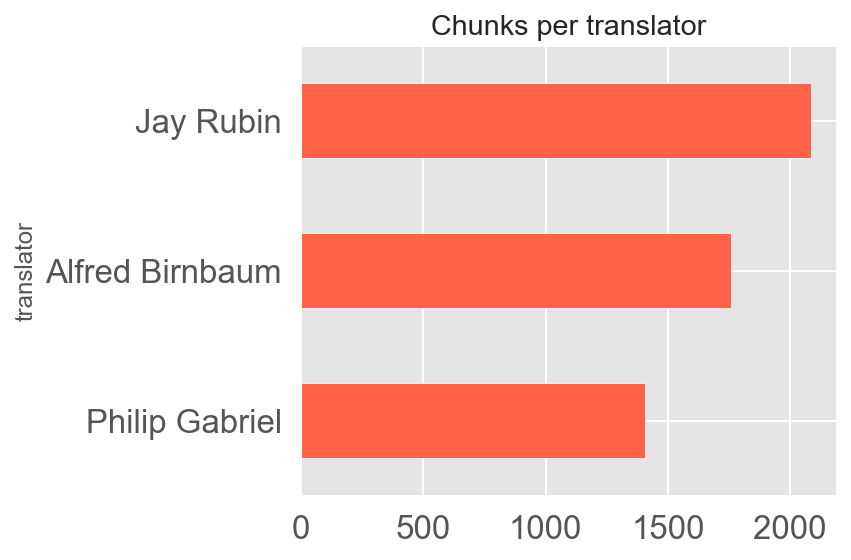

In [79]:
sns.set_palette(['tomato', 'white', 'darkred'])
df.groupby('translator')['chunks'].count().sort_values().plot(kind='barh', title='Chunks per translator')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_translator_01.png')
plt.show()

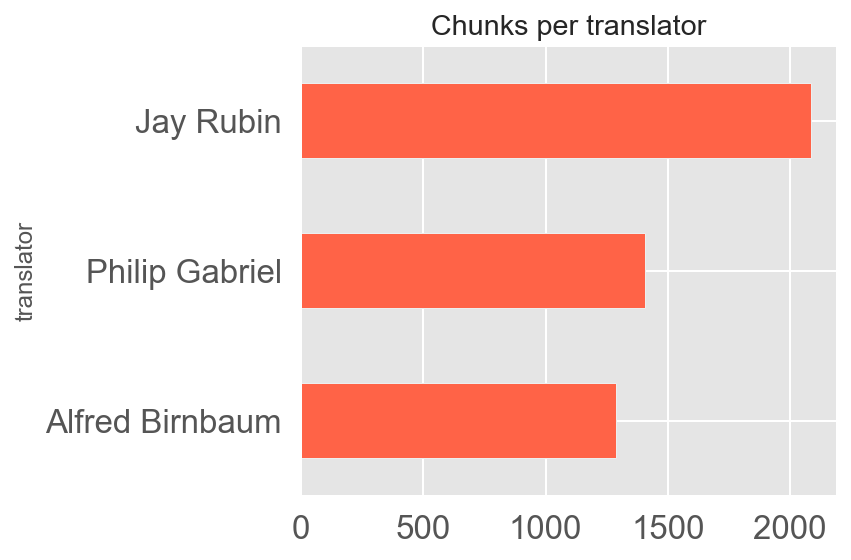

In [78]:
sns.set_palette(['tomato', 'white', 'darkred'])
df[df['book_title'] != 'A Wild Sheep Chase'].groupby('translator')['chunks'].count().sort_values().plot(kind='barh', title='Chunks per translator')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_translator_no_ws_01.png')
plt.show()

In [96]:
df[df['book_title'] != 'A Wild Sheep Chase'].groupby('translator').count()[['chunks']]

,chunks
translator,
Alfred Birnbaum,1288
Jay Rubin,2087
Philip Gabriel,1407


* #### We have the most chunks for Jay Rubin translations and the least for Philip Gabriel
* #### Overall the dataset is relatively balanced for each target value ie. translator

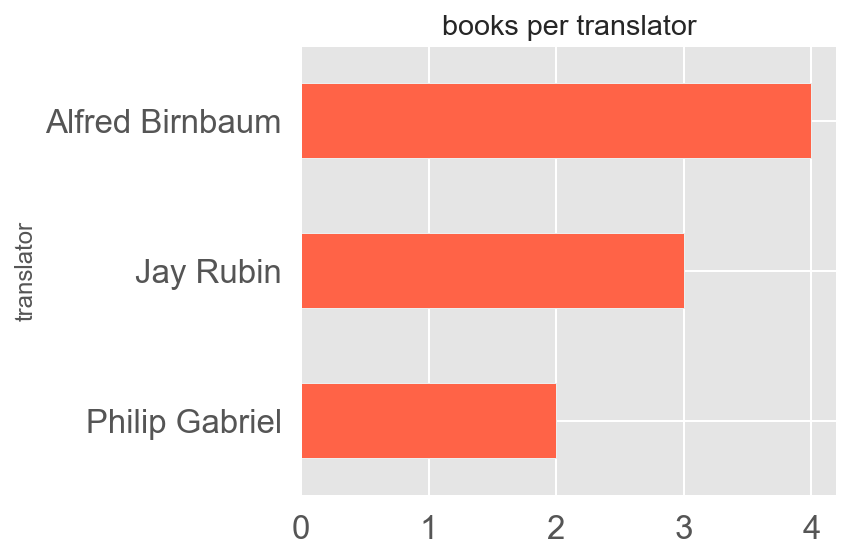

In [74]:
df.groupby('translator')['book_title'].nunique().sort_values().plot(kind='barh', title='books per translator')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_translator_no_ws_01.png')
plt.show()

Despite not having the most chunks we have most books for Alfred Birnbaum. This is due to only a few chapters being available for one of his books

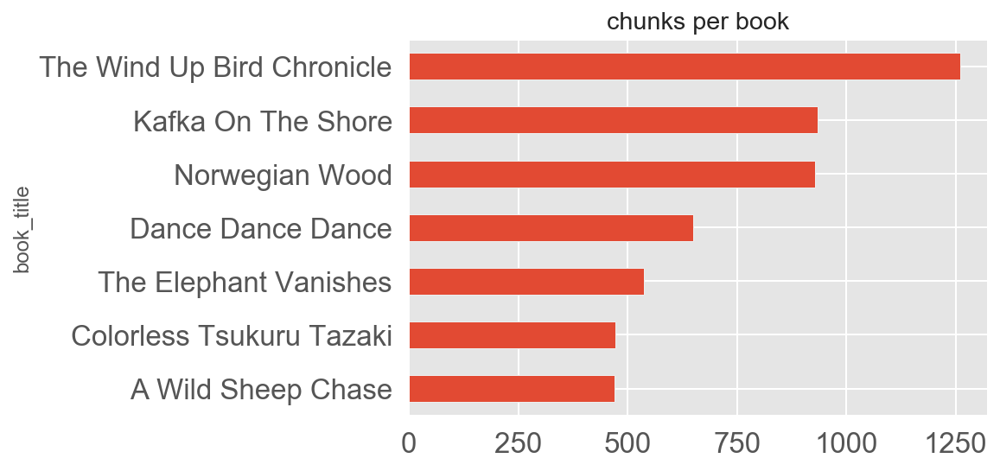

In [11]:
df.groupby('book_title')['chunks'].count().sort_values().plot(kind='barh', title='chunks per book')
plt.show()

In [27]:
df.groupby(['book_title', 'translator'])[['chunks']].count().sort_values(by='translator')

,,chunks
book_title,translator,
A Wild Sheep Chase,Alfred Birnbaum,471
Dance Dance Dance,Alfred Birnbaum,650
Norwegian Wood,Alfred Birnbaum,296
The Elephant Vanishes,Alfred Birnbaum,342
Norwegian Wood,Jay Rubin,632
The Elephant Vanishes,Jay Rubin,195
The Wind Up Bird Chronicle,Jay Rubin,1260
Colorless Tsukuru Tazaki,Philip Gabriel,473
Kafka On The Shore,Philip Gabriel,934


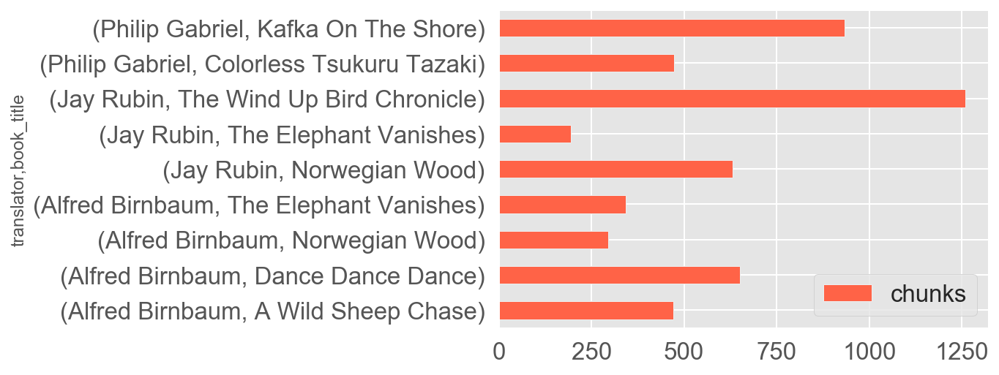

In [39]:
sns.set_palette(['tomato', 'white', 'darkred'])
df.groupby(['translator', 'book_title'])[['chunks']].count().sort_values(by='translator') \
            .plot(kind='barh', stacked=True);

In [54]:
chunks_per_book_t = df.groupby(['translator','book_title'])[['chunks']].count().reset_index()
chunks_per_book_t

,translator,book_title,chunks
0,Alfred Birnbaum,A Wild Sheep Chase,471
1,Alfred Birnbaum,Dance Dance Dance,650
2,Alfred Birnbaum,Norwegian Wood,296
3,Alfred Birnbaum,The Elephant Vanishes,342
4,Jay Rubin,Norwegian Wood,632
5,Jay Rubin,The Elephant Vanishes,195
6,Jay Rubin,The Wind Up Bird Chronicle,1260
7,Philip Gabriel,Colorless Tsukuru Tazaki,473
8,Philip Gabriel,Kafka On The Shore,934


In [58]:
chunks_per_book_t.set_index('book_title', inplace=True)

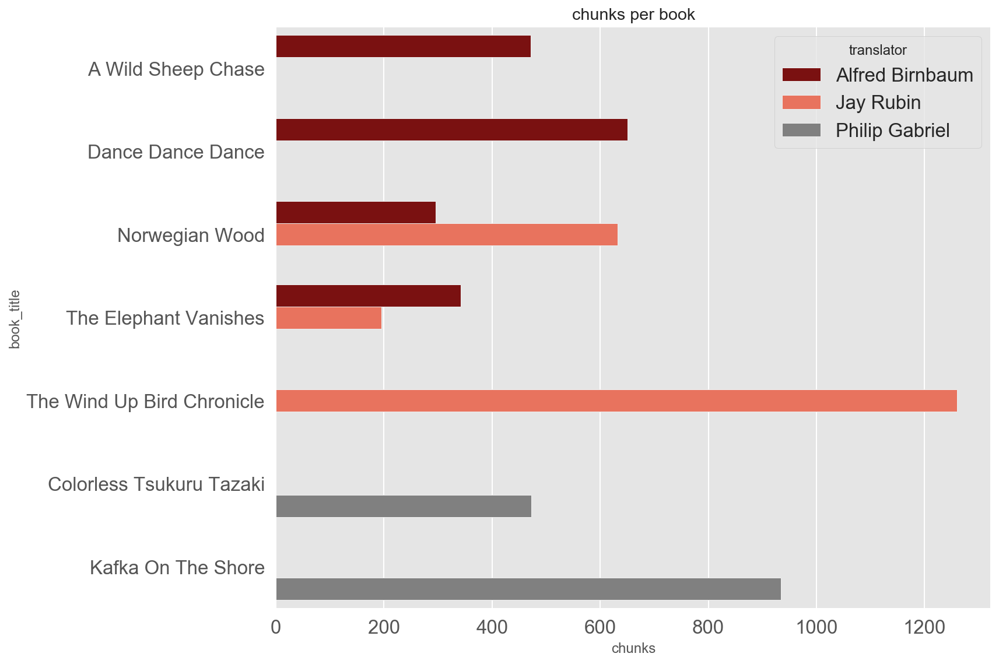

In [72]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set_palette(['darkred', 'tomato', 'gray'])
sns.barplot(y = chunks_per_book_t.index, x='chunks', 
            hue='translator', data=chunks_per_book_t, orient='h')
plt.title('chunks per book')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_per_book_translator_01.png')
plt.show()

#### We can see that The Wind Up Bird Chronicle is the longest nook and more than twice as long as the three shortest books

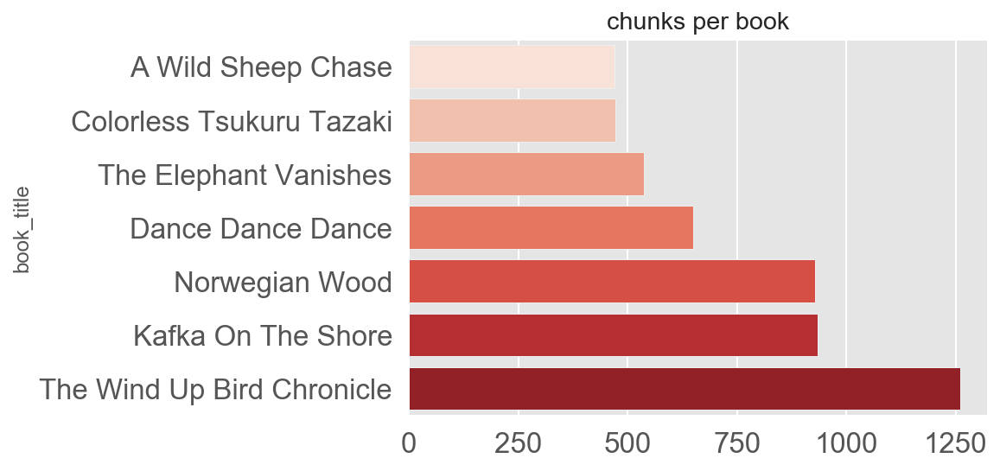

In [21]:
chunks_per_book = df.groupby('book_title')['chunks'].count().sort_values()
sns.barplot(y = chunks_per_book.index, x=chunks_per_book.values, orient = 'h', palette='Reds')
plt.title('chunks per book')
plt.show()

#### We can see that The Wind Up Bird Chronicle is the longest nook and more than twice as long as the three shortest books
* we should note that there are two versions of Norwegian wood so a single version is shorter than shown above

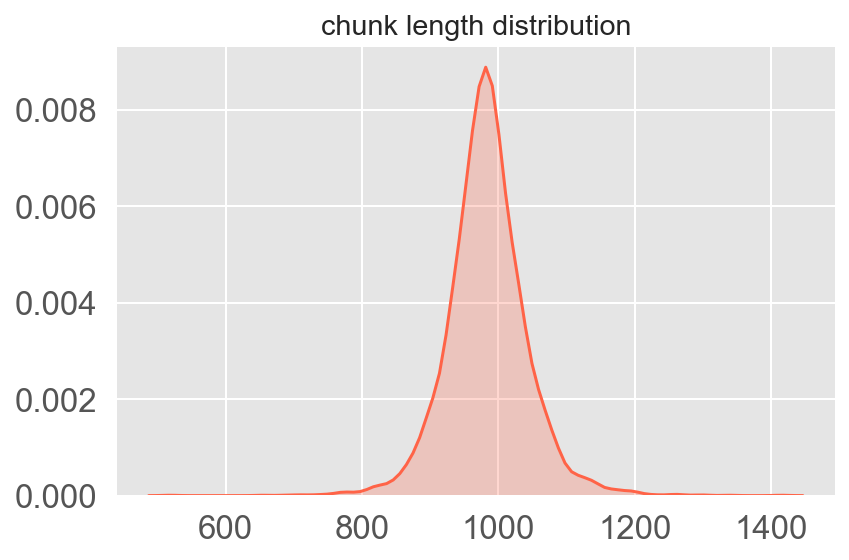

In [91]:
fig, ax = plt.subplots(figsize=(6, 4))
sns.kdeplot(df.chunk_length, shade=True, legend=False)
plt.title('chunk length distribution')
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/chunks_length dist_01.png')
plt.show()

#### The chunk lengths are normally distributed around 1000 as expected

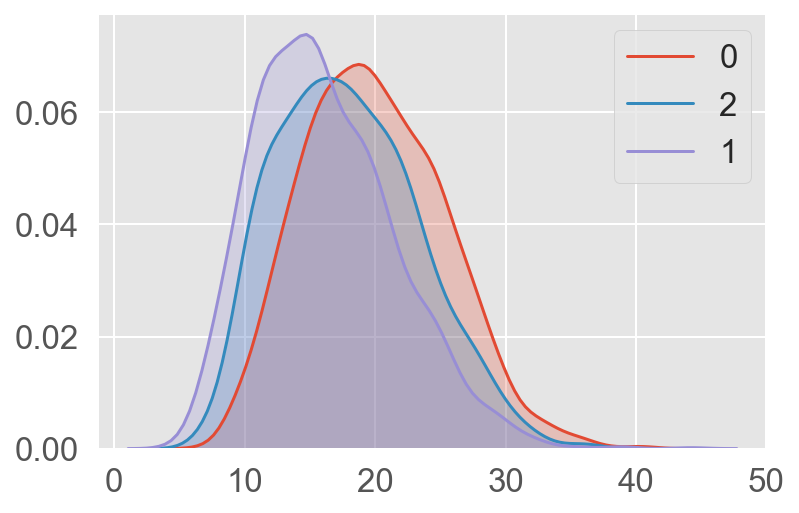

In [14]:
for t in df.trans_code.unique():
    sns.kdeplot(df[df.trans_code == t].n_sents_norm, label=t, shade=True)
plt.show()

#### We can see above that some of the features are distributed differently for each translator which is a positive sign that we may be able to use the features to distinguish between the translators

### Vader Analysis check
* We may not use the Vader sentiment analysis to distinguish between translators as the sentiment may be more likley to vary between novels reather than translator. As most novels only have one translator it may help us distinguish the books but we won't gain any insight into the translator styles

In [15]:
df_vader_summary = df.groupby(['book_title', 'translator']).mean()[['vader_neg', 'vader_neu', 'vader_pos']]

In [16]:
df_vader_summary

vader_neg  vader_neu  vader_pos
book_title                 translator                                      
A Wild Sheep Chase         Alfred Birnbaum   0.050673   0.884849   0.064484
Colorless Tsukuru Tazaki   Philip Gabriel    0.053884   0.845146   0.100956
Dance Dance Dance          Alfred Birnbaum   0.066423   0.844732   0.088838
Kafka On The Shore         Philip Gabriel    0.066258   0.840794   0.092978
Norwegian Wood             Alfred Birnbaum   0.057314   0.844270   0.098341
                           Jay Rubin         0.061810   0.838723   0.099448
The Elephant Vanishes      Alfred Birnbaum   0.056371   0.875380   0.068240
                           Jay Rubin         0.053123   0.872595   0.074272
The Wind Up Bird Chronicle Jay Rubin         0.068056   0.861113   0.070831

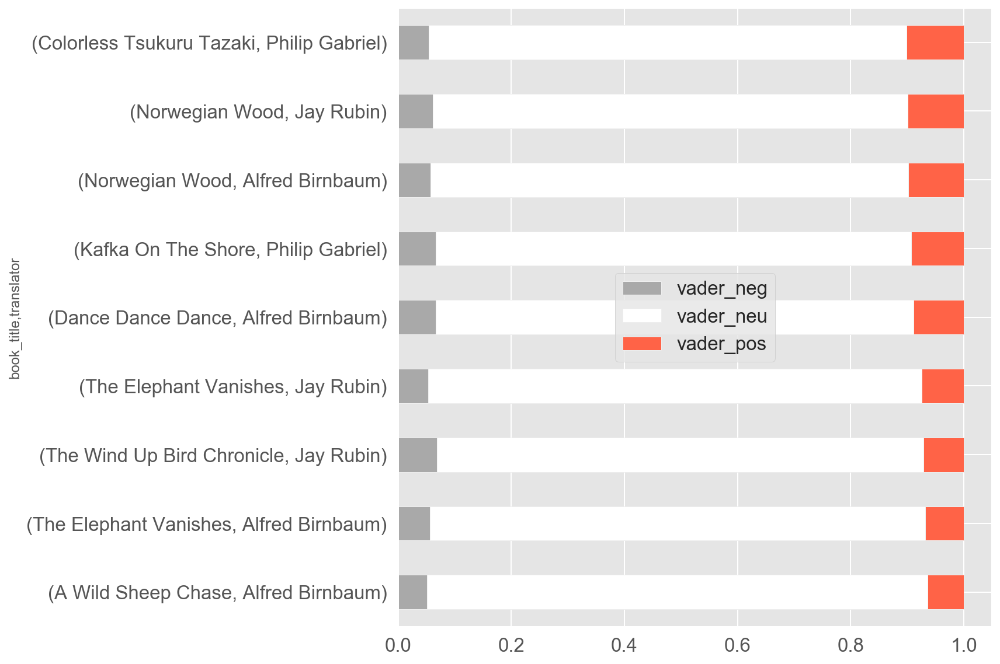

In [67]:
sns.set_palette(['darkgray', 'white', 'tomato'])
fig, ax = plt.subplots(figsize=(12, 8))
# df_vader_summary.sort_values('vader_pos').plot(kind='barh', stacked=True, colormap="coolwarm", ax=ax)
df_vader_summary.sort_values('vader_pos').plot(kind='barh', stacked=True, ax=ax)
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/vader_scores_01.png')
plt.show()

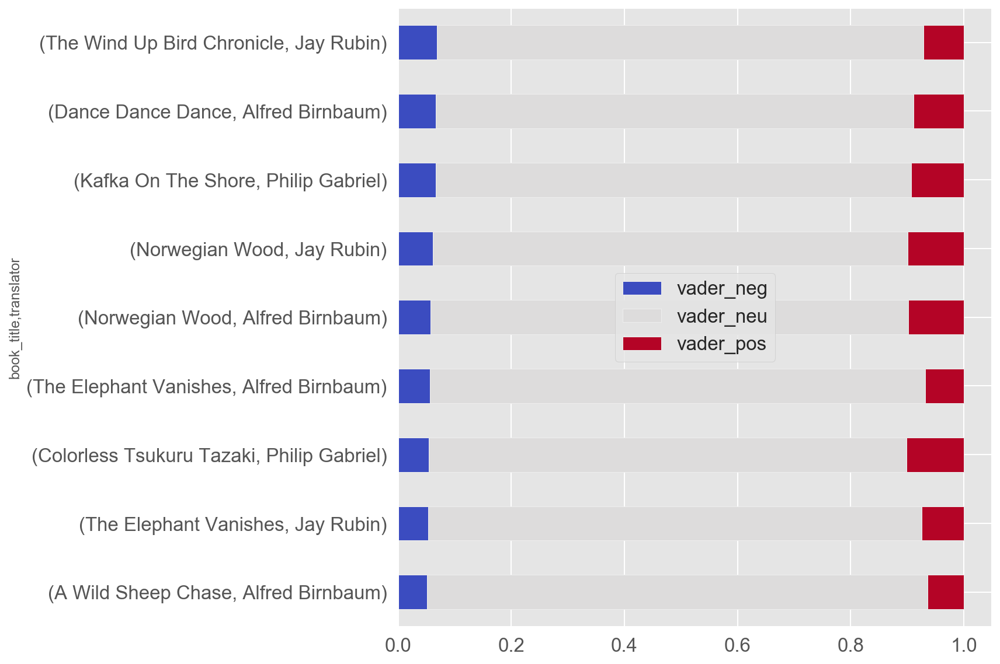

In [30]:
fig, ax = plt.subplots(figsize=(12, 8))
df_vader_summary.sort_values('vader_neg').plot(kind='barh', stacked=True, colormap="coolwarm", ax=ax)
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.tight_layout()
plt.show()

#### We can see that the sentiment varies a bit from book to book 
#### However for 'Norwegian Wood' each translated text has similar sentiment analysis
#### This helps confirm that the sentiment analysis is a better indicator of the book than the translator

In [31]:
# df_vader_summary['vader_pos'].T.sort_values().plot(kind='barh')
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# plt.show()

In [32]:
# df_vader_summary['vader_neg'].T.sort_values().plot(kind='barh')
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# plt.show()

In [33]:
# df_vader_summary['vader_neu'].T.sort_values().plot(kind='barh')
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# plt.show()

#### Some further sentiment analysis plots below  - showing distribution per book - more difficult to read however

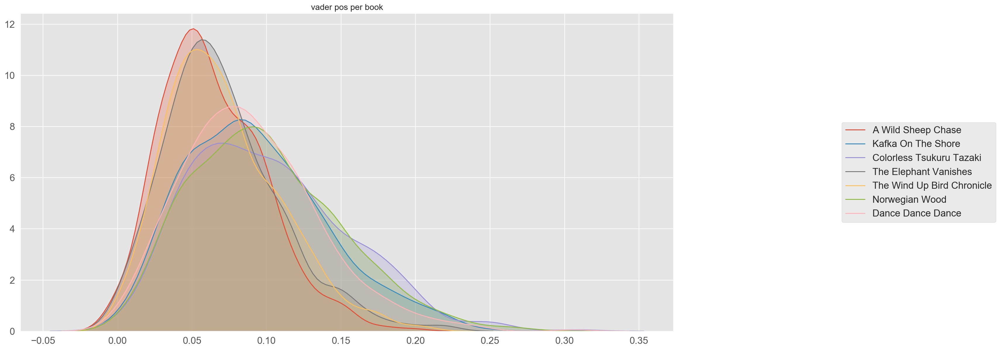

In [34]:
plt.figure(figsize=(20,10))
for t in df.book_title.unique():
    sns.kdeplot(df[df.book_title == t].vader_pos, label=t, shade=True)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.title('vader pos per book')
plt.show()

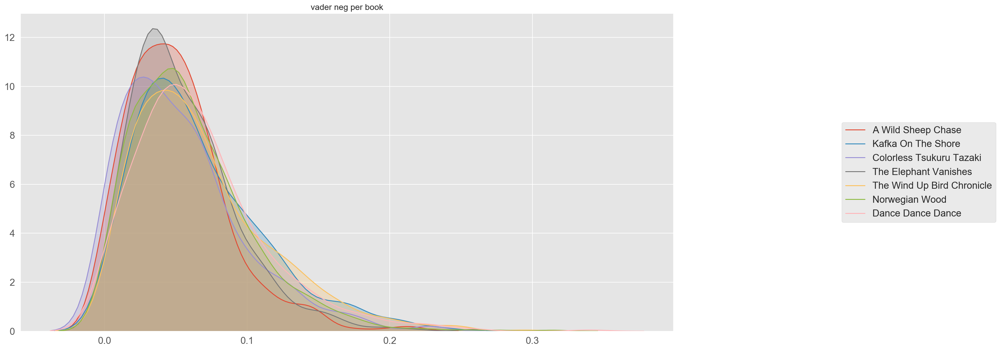

In [35]:
plt.figure(figsize=(20,10))
for t in df.book_title.unique():
    sns.kdeplot(df[df.book_title == t].vader_neg, label=t, shade=True)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.title('vader neg per book')
plt.show()

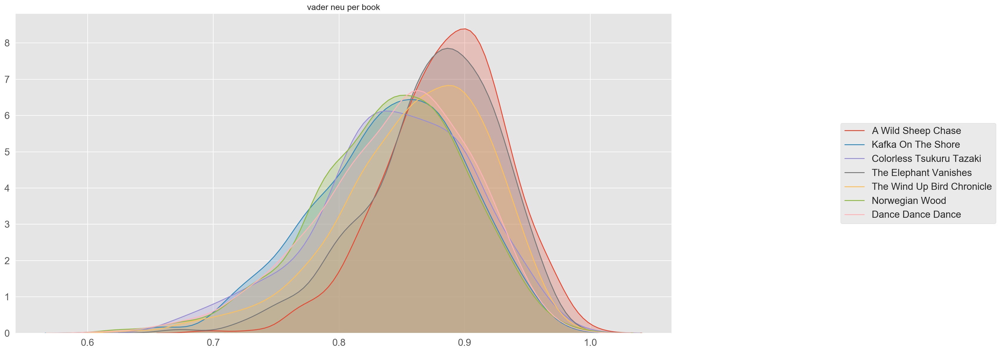

In [36]:
plt.figure(figsize=(20,10))
for t in df.book_title.unique():
    sns.kdeplot(df[df.book_title == t].vader_neu, label=t, shade=True)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.title('vader neu per book')
plt.show()

### We can look at some of the predictor variable columns in pairplots

In [37]:
predictor_cols = [i for i in df.columns if i.endswith('_norm')]
len(predictor_cols)

26

In [38]:
predictor_cols[:5]

['n_sents_norm',
 'n_words_norm',
 'n_chars_norm',
 'n_syllables_norm',
 'n_unique_words_norm']

In [39]:
pred_cols_1 = list(predictor_cols)[:5]
pred_cols_1.extend(['trans_code'])
pred_cols_2 = list(predictor_cols)[5:10]
pred_cols_2.extend(['trans_code'])
pred_cols_3 = list(predictor_cols)[10:15]
pred_cols_3.extend(['trans_code'])
pred_cols_4 = list(predictor_cols)[15:20]
pred_cols_4.extend(['trans_code'])
pred_cols_5 = list(predictor_cols)[20:]
pred_cols_5.extend(['trans_code'])

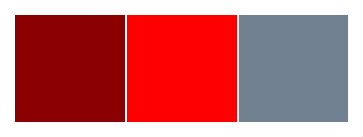

In [133]:
qualitative_colors = sns.color_palette(['darkred', 'red', 'slategray'])
sns.palplot(qualitative_colors)

In [111]:
print(plt.rcParams['axes.prop_cycle'].by_key()['color'])

[(0.8941176470588236, 0.10196078431372549, 0.10980392156862745), (0.21568627450980393, 0.49411764705882355, 0.7215686274509804), (0.30196078431372547, 0.6862745098039216, 0.2901960784313726), (0.596078431372549, 0.3058823529411765, 0.6392156862745098), (1.0, 0.4980392156862745, 0.0), (1.0, 1.0, 0.2), (0.6509803921568628, 0.33725490196078434, 0.1568627450980392), (0.9686274509803922, 0.5058823529411764, 0.7490196078431373), (0.6, 0.6, 0.6)]


In [131]:
import matplotlib.colors as mcolors

data = np.random.rand(10,10) * 2 - 1

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
colors1 = plt.cm.binary(np.linspace(0., 1, 128))
colors2 = plt.cm.gist_heat_r(np.linspace(0, 1, 128))

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
colors1 = plt.cm.binary(np.linspace(0., 1, 128))
colors2 = plt.cm.gist_heat_r(np.linspace(0, 1, 128))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)


In [ ]:
'darkred' 'lightcoral' 'slategray'

In [ ]:
cm = LinearSegmentedColormap.from_list(
        cmap_name, colors, N=n_bin)

<Figure size 1152x1152 with 0 Axes>

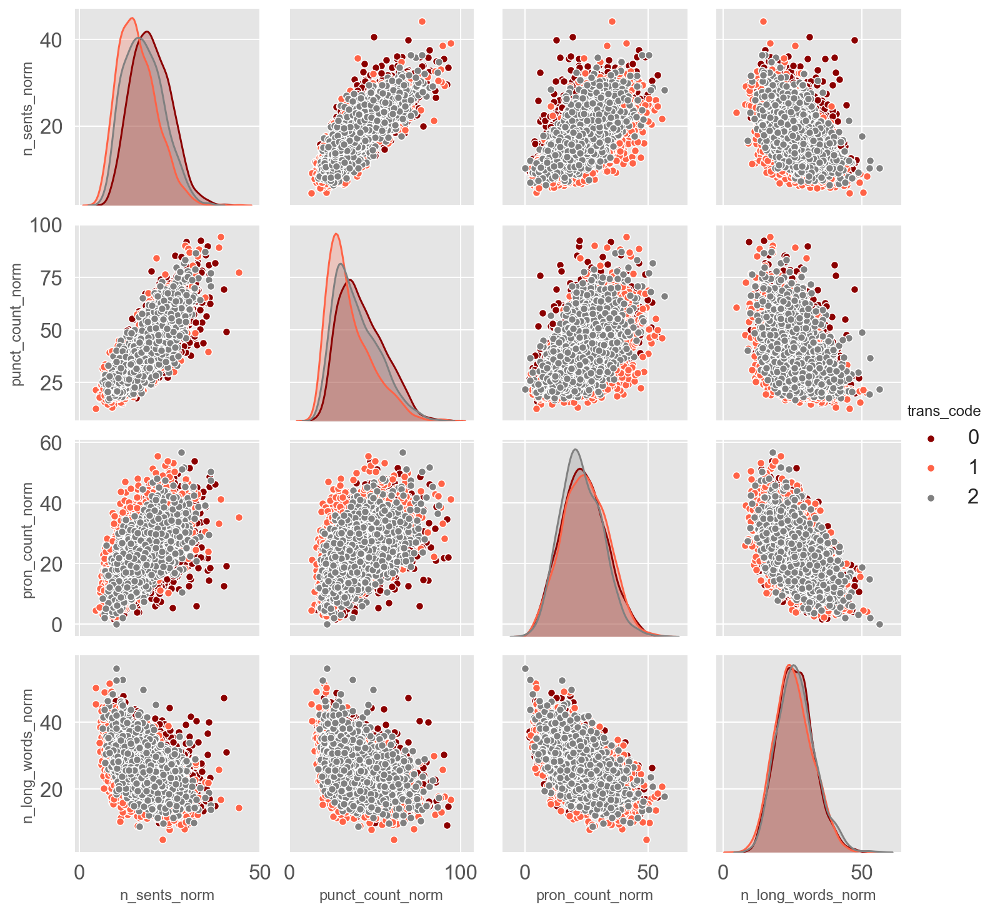

In [18]:
plt.figure(figsize=(16,16))
preds_sel = ['n_sents_norm', 'punct_count_norm', 'pron_count_norm', 'n_long_words_norm', 'trans_code']
# sns.set_palette("Reds", 6)
sns.set_palette(['darkred', 'tomato', 'gray'])
# sns.set_palette("Set1")
sns.pairplot(df[preds_sel], hue='trans_code')
plt.savefig('../../../../Documents/murakami/plots/pairplot_01.png')
plt.show()

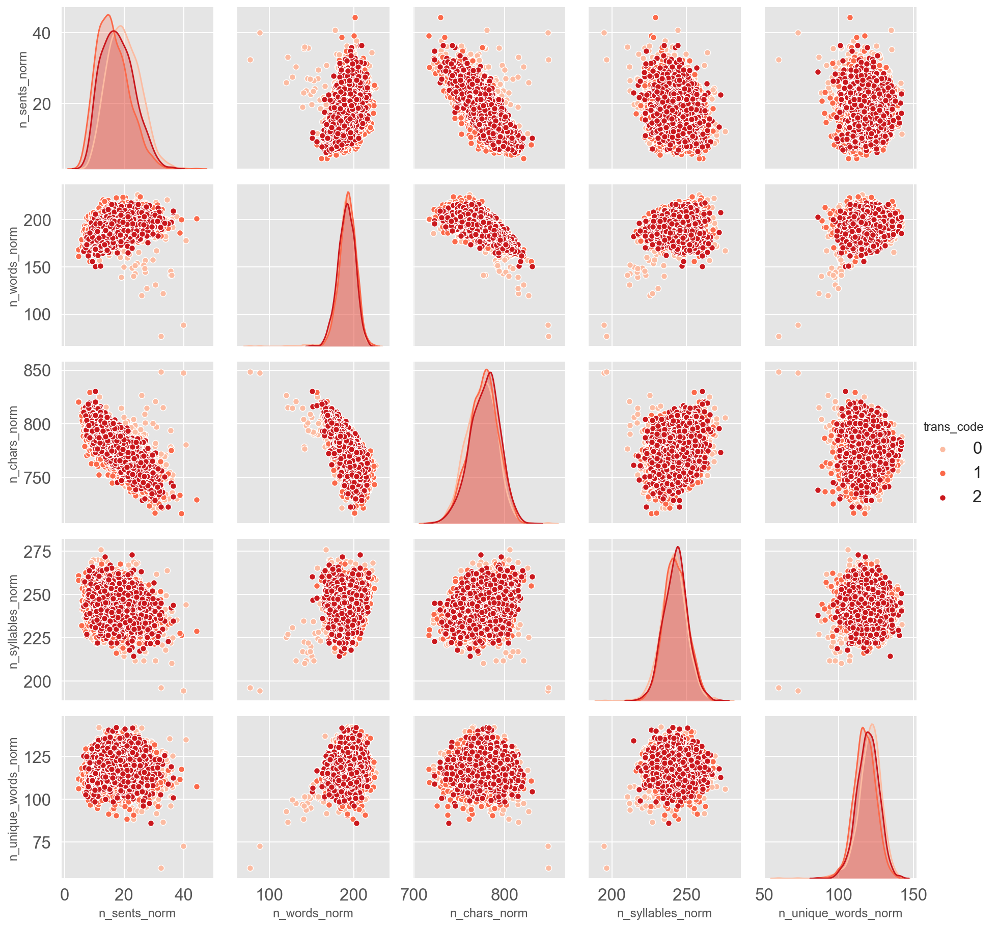

In [45]:
sns.set_palette("Reds", 3)
sns.pairplot(df[pred_cols_1], hue='trans_code');

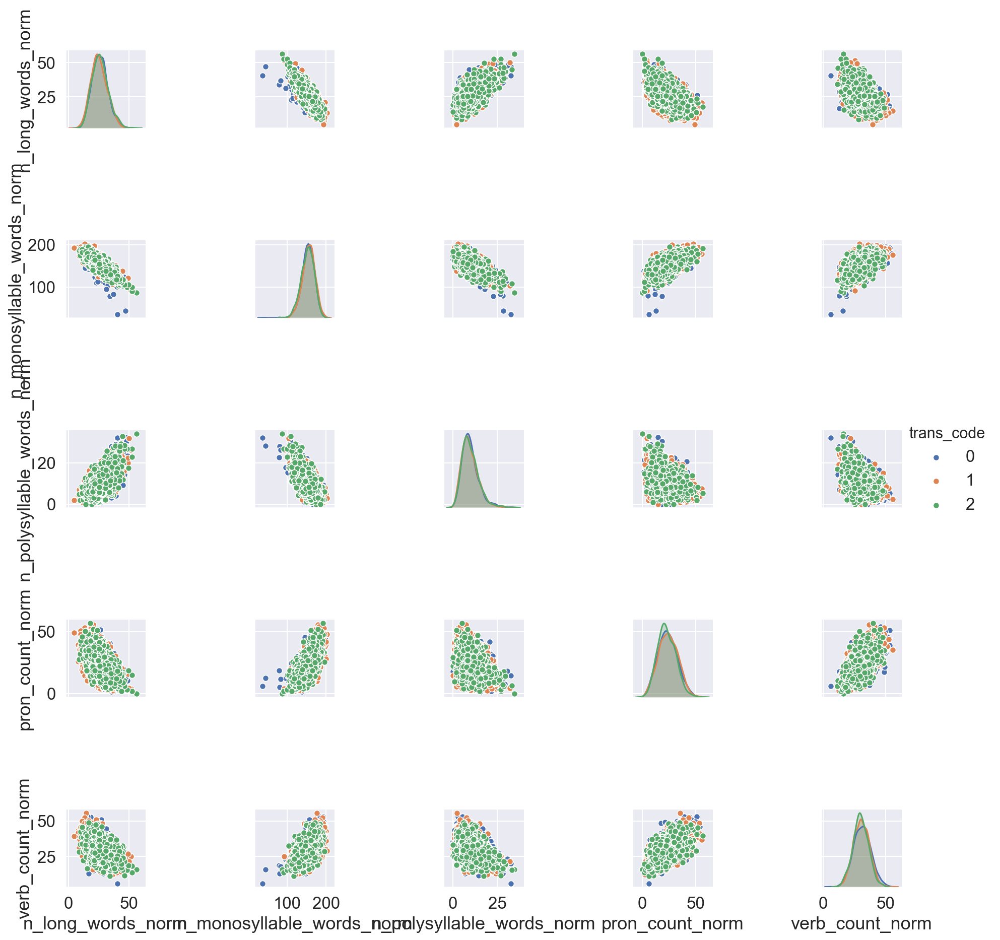

In [35]:
sns.pairplot(df[pred_cols_2], hue='trans_code');

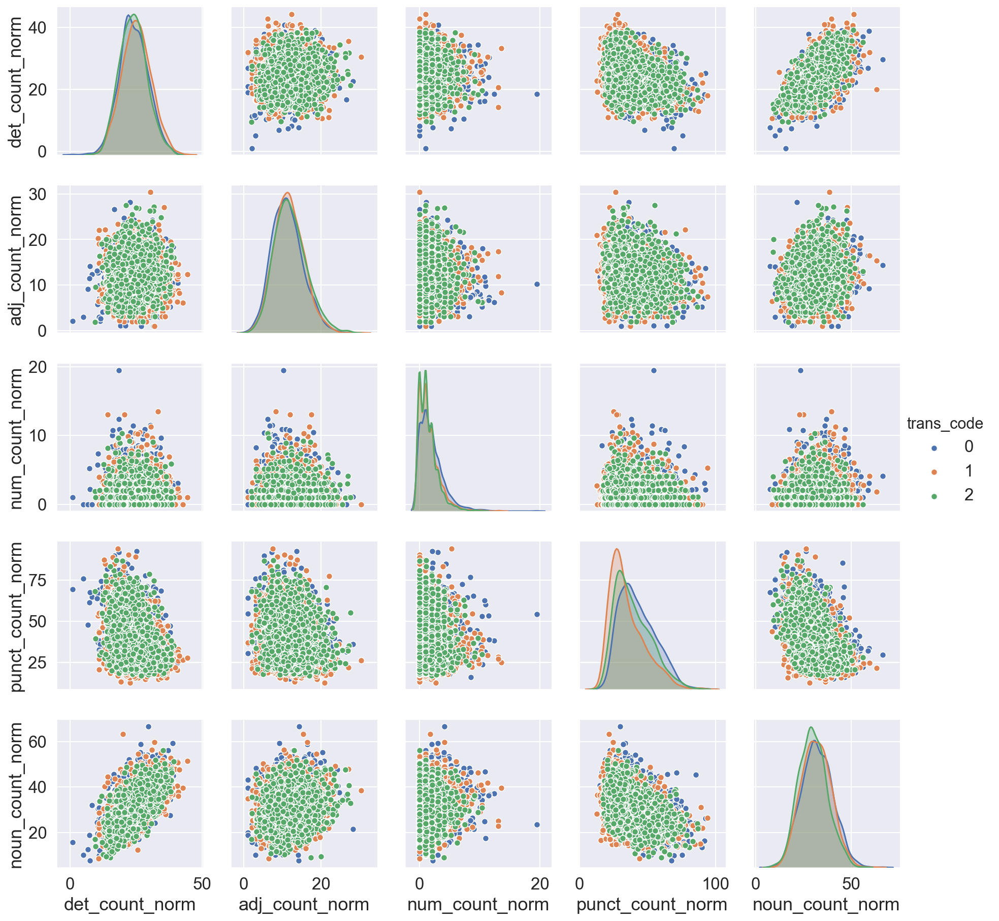

In [36]:
sns.pairplot(df[pred_cols_3], hue='trans_code');

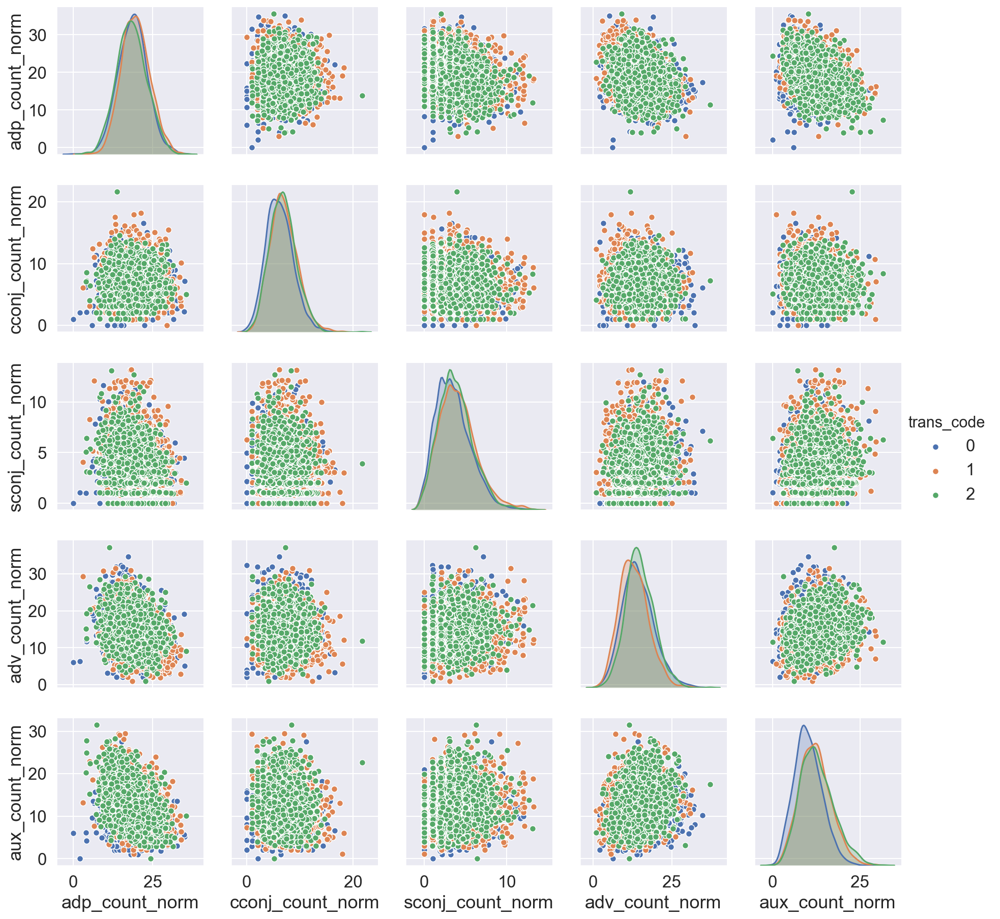

In [37]:
sns.pairplot(df[pred_cols_4], hue='trans_code');

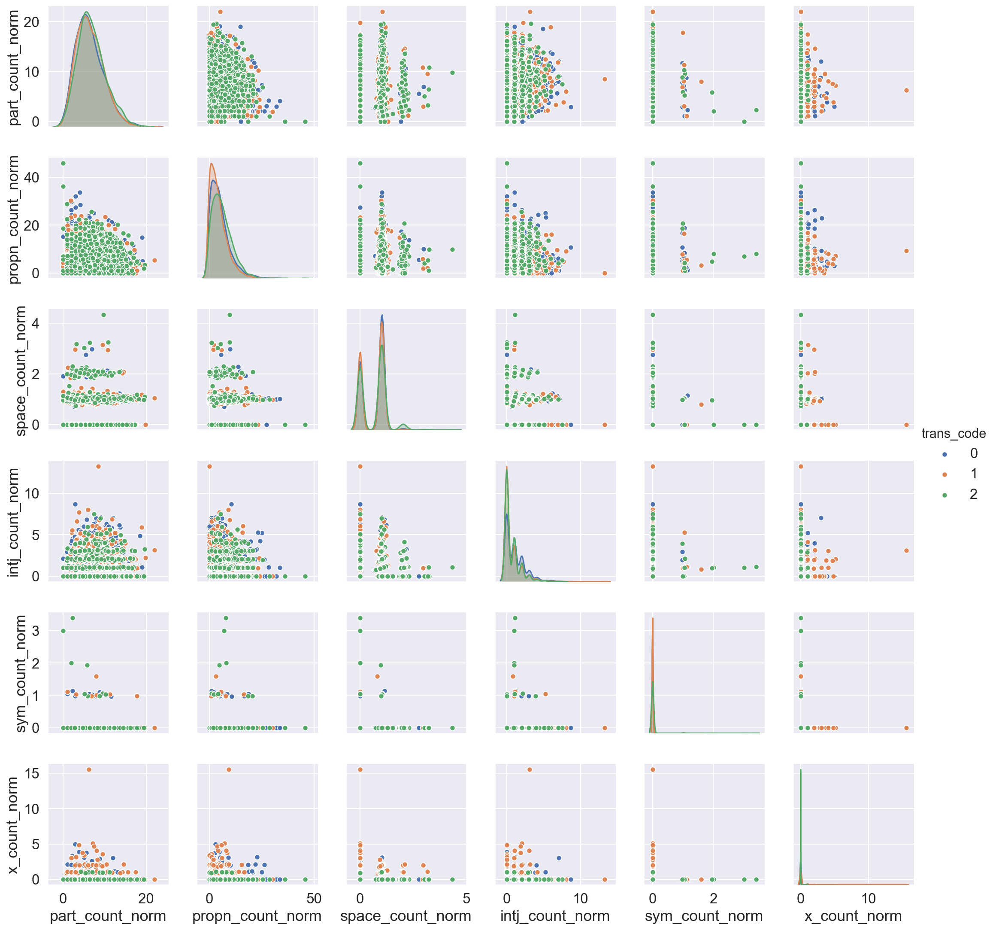

In [38]:
sns.pairplot(df[pred_cols_5], hue='trans_code');

### Comments on the pairplots

* sym_count_norm and x_count_norm are often 0. May drop these columns as predictors later
* space_count_norm column previously looked unusual but removing double spaces earlier has helped 
* many of the other variables are normally distributed, sometimes with a right skew
* often the density and crossplots for each translator overlap quite closely
* translator 0 (Birnbaum) at first glance looks to be the most distinguishable

In [50]:
entities = textacy.extract.entities(df['parsed'].iloc[2])
for ent in entities:
    print(ent)

One
Mickey Spillane
Kenzaburo Oe
Allen Ginsberg
days
days
Stones
Byrds
Deep Purple
Moody Blues


In [51]:
[(word, word.ent_type_) for word in df['parsed'].iloc[2] if len(word.ent_type_)]

[(One, 'CARDINAL'),
 (Mickey, 'ORG'),
 (Spillane, 'ORG'),
 (Kenzaburo, 'PERSON'),
 (Oe, 'PERSON'),
 (Allen, 'PERSON'),
 (Ginsberg, 'PERSON'),
 (those, 'DATE'),
 (days, 'DATE'),
 (the, 'DATE'),
 (days, 'DATE'),
 (Stones, 'ORG'),
 (Byrds, 'GPE'),
 (Deep, 'PERSON'),
 (Purple, 'PERSON'),
 (the, 'FAC'),
 (Moody, 'FAC'),
 (Blues, 'FAC')]

### Try some word clouds

In [52]:
# Importing necessary libraries
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

In [53]:
# wordcloud.to_file("img/first_chunk.png")

In [54]:
text = " ".join(chunk for chunk in df.chunks.iloc[:-2])
print ("There are {} words in the combination of all chunks.".format(len(text)))

There are 5169639 words in the combination of all chunks.


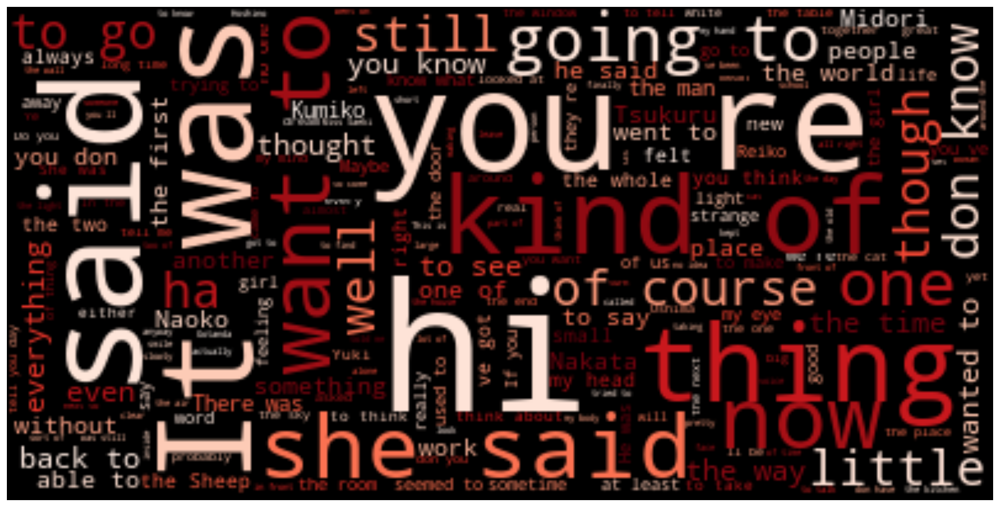

In [67]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["wa"])

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="black", colormap='Reds').generate(text)

fig, ax = plt.subplots(figsize=(18, 10))
# Display the generated image:
# the matplotlib way:
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis("off")
plt.show()

In [198]:
for book in df.book_title.unique():
    print(book)

A Wild Sheep Chase
Kafka On The Shore
Colorless Tsukuru Tazaki
The Elephant Vanishes
The Wind Up Bird Chronicle
Norwegian Wood
Dance Dance Dance


In [69]:
book_texts = {}
for book in df.book_title.unique():
    book_texts[book] = " ".join(chunk for chunk in df.chunks[df.book_title == book])

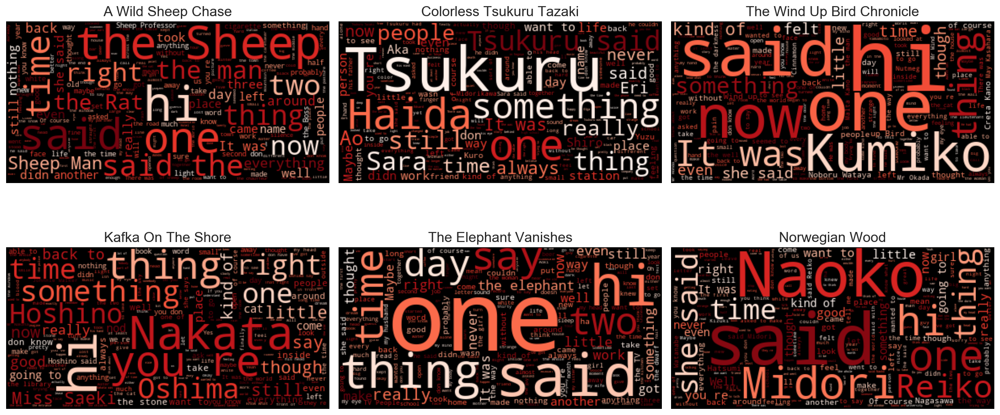

In [87]:
fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(16, 8), sharex=False, sharey=True)
    
for i, book in enumerate(book_texts):
    if i < 6:
        # Generate a word cloud image
        wordcloud = WordCloud(stopwords=stopwords, background_color="black", colormap='Reds').generate(book_texts[book])
        ax[i%2, int(i/2)].imshow(wordcloud, interpolation='bilinear')
        ax[i%2, int(i/2)].axis("off")
        ax[i%2, int(i/2)].set_title(book, fontsize=16)

plt.tight_layout()
plt.savefig('../../../../Documents/murakami/plots/wordclouds.png')
# plt.subplots_adjust(hspace=0.6)
plt.show()

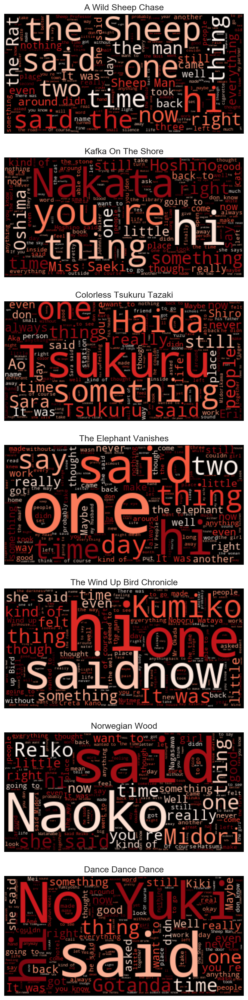

In [70]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["wa"])
fig, ax = plt.subplots(nrows = len(book_texts), figsize=(18, 30))
for i, book in enumerate(book_texts):
    # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, background_color="black", colormap='Reds').generate(book_texts[book])
    ax[i].imshow(wordcloud, interpolation='bilinear')
    ax[i].axis("off")
    ax[i].set_title(book)

plt.show()
    

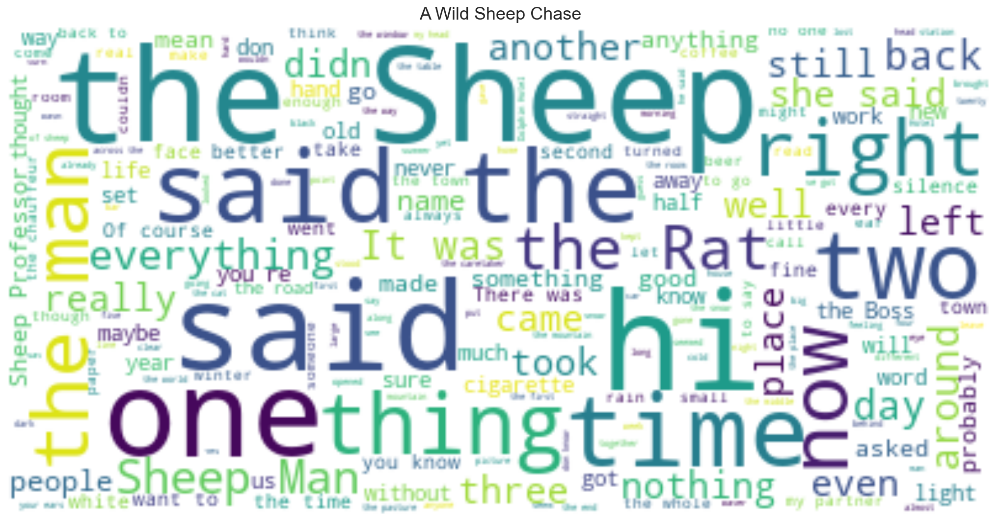

In [215]:
# Create stopword list:
stopwords = set(STOPWORDS)
# stopwords.update(["wa"])

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(book_texts['A Wild Sheep Chase'])

fig, ax = plt.subplots(figsize=(18, 10))
# Display the generated image:
# the matplotlib way:
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis("off")
plt.title('A Wild Sheep Chase')
plt.show()

### Try expanding the contractions and add as a new chunk

In [88]:
CONTRACTION_MAP = {
"ain't": "is not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how is",
"I'd": "I would",
"I'd've": "I would have",
"I'll": "I will",
"I'll've": "I will have",
"I'm": "I am",
"I've": "I have",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what will",
"what'll've": "what will have",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"when've": "when have",
"where'd": "where did",
"where's": "where is",
"where've": "where have",
"who'll": "who will",
"who'll've": "who will have",
"who's": "who is",
"who've": "who have",
"why's": "why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you would",
"you'd've": "you would have",
"you'll": "you will",
"you'll've": "you will have",
"you're": "you are",
"you've": "you have"
}

In [89]:
def expand_contractions(text, contraction_mapping=CONTRACTION_MAP):
    
    contractions_pattern = re.compile('({})'.format('|'.join(contraction_mapping.keys())), 
                                      flags=re.IGNORECASE|re.DOTALL)
    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contraction_mapping.get(match)\
                                if contraction_mapping.get(match)\
                                else contraction_mapping.get(match.lower())                       
        expanded_contraction = first_char+expanded_contraction[1:]
        return expanded_contraction
        
    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)
    return expanded_text

In [90]:
df['chunks_expand'] = df['chunks'].apply(expand_contractions)

In [91]:
df[['chunks', 'chunks_expand']]

,chunks,chunks_expand
0,IT WAS A short one-paragraph item in the morni...,IT WAS A short one-paragraph item in the morni...
1,I got off near the end of the line. The map p...,I got off near the end of the line. The map p...
2,There was a small coffee shop near the univer...,There was a small coffee shop near the univer...
3,"She and I would trade books, talk endlessly, ...","She and I would trade books, talk endlessly, ..."
4,"Once, and only once, I asked her about these ...","Once, and only once, I asked her about these ..."
...,...,...
5248,"""Me, I like your wrinkles."" ""I could just cry...","""Me, I like your wrinkles."" ""I could just cry..."
5249,"""I’d be ashamed to get pregnant at my age."" ""D...","""I’d be ashamed to get pregnant at my age."" ""D..."
5250,I could feel Reiko swallow her breath undernea...,I could feel Reiko swallow her breath undernea...
5251,"""I want to take the Aomori-Hakodate Ferry. Who...","""I want to take the Aomori-Hakodate Ferry. Who..."


### Try some bag of word analysis

### Try first on chunks without contraction expansion and no stop words

In [92]:
#  set vectorizer
cvec = CountVectorizer()

# Fit our vectorizer using our train data
cvec.fit(df['chunks'])

# Transform training data
cvec_mat = cvec.transform(df['chunks'])

# words occuring
words = cvec.get_feature_names()

# number of different words
print(len(words))

23641


In [93]:
# plt.figure(figsize=(12, 18))
# plt.spy(cvec_mat, markersize=0.001, aspect=10)
# plt.show()

In [94]:
df_bow_nostop = pd.DataFrame(cvec_mat.toarray(),
                  columns=cvec.get_feature_names())

In [95]:
df_bow_nostop_0 = df_bow_nostop[df['trans_code'] == 0].sum().sort_values(ascending=False).head(20)
df_bow_nostop_1 = df_bow_nostop[df['trans_code'] == 1].sum().sort_values(ascending=False).head(20)
df_bow_nostop_2 = df_bow_nostop[df['trans_code'] == 2].sum().sort_values(ascending=False).head(20)

In [96]:
# fig, ax = plt.subplots(nrows=3, figsize=(12, 18))
# df_bow_nostop_0.plot(kind='barh', ax=ax[0])
# df_bow_nostop_1.plot(kind='barh', ax=ax[1])
# df_bow_nostop_2.plot(kind='barh', ax=ax[2])
# plt.show()

### Try on chunks without contraction expansion but with stop words

In [97]:
#  set vectorizer
cvec = CountVectorizer(stop_words='english')

# Fit our vectorizer using our train data
cvec.fit(df['chunks'])

# Transform training data
cvec_mat = cvec.transform(df['chunks'])

# words occuring
words = cvec.get_feature_names()

# number of different words
print(len(words))

23345


In [98]:
df_bow_stop = pd.DataFrame(cvec_mat.toarray(),
                  columns=cvec.get_feature_names())

In [99]:
df_bow_stop_0 = df_bow_stop[df['trans_code'] == 0].sum().sort_values(ascending=False).head(20)
df_bow_stop_1 = df_bow_stop[df['trans_code'] == 1].sum().sort_values(ascending=False).head(20)
df_bow_stop_2 = df_bow_stop[df['trans_code'] == 2].sum().sort_values(ascending=False).head(20)

In [100]:
# fig, ax = plt.subplots(nrows=3, figsize=(12, 18))
# df_bow_stop_0.plot(kind='barh', ax=ax[0])
# df_bow_stop_1.plot(kind='barh', ax=ax[1])
# df_bow_stop_2.plot(kind='barh', ax=ax[2])
# plt.show()

### Try on chunks with contraction expansion and no stop words

In [101]:
#  set vectorizer
cvec = CountVectorizer()

# Fit our vectorizer using our train data
cvec.fit(df['chunks_expand'])

# Transform training data
cvec_mat = cvec.transform(df['chunks_expand'])

# words occuring
words = cvec.get_feature_names()

# number of different words
print(len(words))

23641


In [102]:
df_bow_ex_nostop = pd.DataFrame(cvec_mat.toarray(),
                  columns=cvec.get_feature_names())

In [103]:
df_bow_ex_nostop_0 = df_bow_ex_nostop[df['trans_code'] == 0].sum().sort_values(ascending=False).head(20)
df_bow_ex_nostop_1 = df_bow_ex_nostop[df['trans_code'] == 1].sum().sort_values(ascending=False).head(20)
df_bow_ex_nostop_2 = df_bow_ex_nostop[df['trans_code'] == 2].sum().sort_values(ascending=False).head(20)

In [104]:
# fig, ax = plt.subplots(nrows=3, figsize=(12, 18))
# df_bow_ex_nostop_0.plot(kind='barh', ax=ax[0])
# df_bow_ex_nostop_1.plot(kind='barh', ax=ax[1])
# df_bow_ex_nostop_2.plot(kind='barh', ax=ax[2])
# plt.show()

### Try on chunks with contraction expansion and with stop words

In [105]:
#  set vectorizer
cvec = CountVectorizer(stop_words='english', token_pattern=pattern)

# Fit our vectorizer using our train data
cvec.fit(df['chunks_expand'])

# Transform training data
cvec_mat = cvec.transform(df['chunks_expand'])

# words occuring
words = cvec.get_feature_names()

# number of different words
print(len(words))

NameError: name 'pattern' is not defined

In [ ]:
df_bow_ex_stop = pd.DataFrame(cvec_mat.toarray(),
                  columns=cvec.get_feature_names())

In [ ]:
df_bow_ex_stop_0 = df_bow_ex_stop[df['trans_code'] == 0].sum().sort_values(ascending=False).head(20)
df_bow_ex_stop_1 = df_bow_ex_stop[df['trans_code'] == 1].sum().sort_values(ascending=False).head(20)
df_bow_ex_stop_2 = df_bow_ex_stop[df['trans_code'] == 2].sum().sort_values(ascending=False).head(20)

In [ ]:
# fig, ax = plt.subplots(nrows=3, figsize=(12, 18))
# df_bow_ex_stop_0.plot(kind='barh', ax=ax[0])
# df_bow_ex_stop_1.plot(kind='barh', ax=ax[1])
# df_bow_ex_stop_2.plot(kind='barh', ax=ax[2])
# plt.show()

In [ ]:
# sub_df = df_bow_ex_stop.join(df['trans_code']).groupby('trans_code').sum().sort_values(by=0, ascending=False, axis=1)
# sub_df.iloc[:,:10].plot(kind='bar', figsize=(18,8))
# plt.title('expanded - stop words used')
# plt.show()

In [ ]:
# sub_df = df_bow_ex_nostop.join(df['trans_code']).groupby('trans_code').sum().sort_values(by=0, ascending=False, axis=1)
# sub_df.iloc[:,:10].plot(kind='bar', figsize=(18,8))
# plt.title('expanded - stop words not used')
# plt.show()

In [ ]:
sub_df = df_bow_ex_nostop.join(df['trans_code']).groupby('trans_code').sum().sort_values(by=0, ascending=False, axis=1)
sub_df.iloc[:,:10].T.plot(kind='barh', figsize=(8,8))
plt.title('expanded - stop words not used')
plt.show()

In [113]:
# count the total number of words per translator to allow us to normalise the counts of each individual word
trans_word_counts = df_bow_ex_nostop.join(df['trans_code']).groupby('trans_code').sum().sum(axis=1)

In [114]:
trans_word_counts

trans_code
0    300234
1    366411
2    246291
dtype: int64

In [115]:
# find the normalized counts using total counts per translator
sub_df_norm = sub_df.div(trans_word_counts, axis=0)

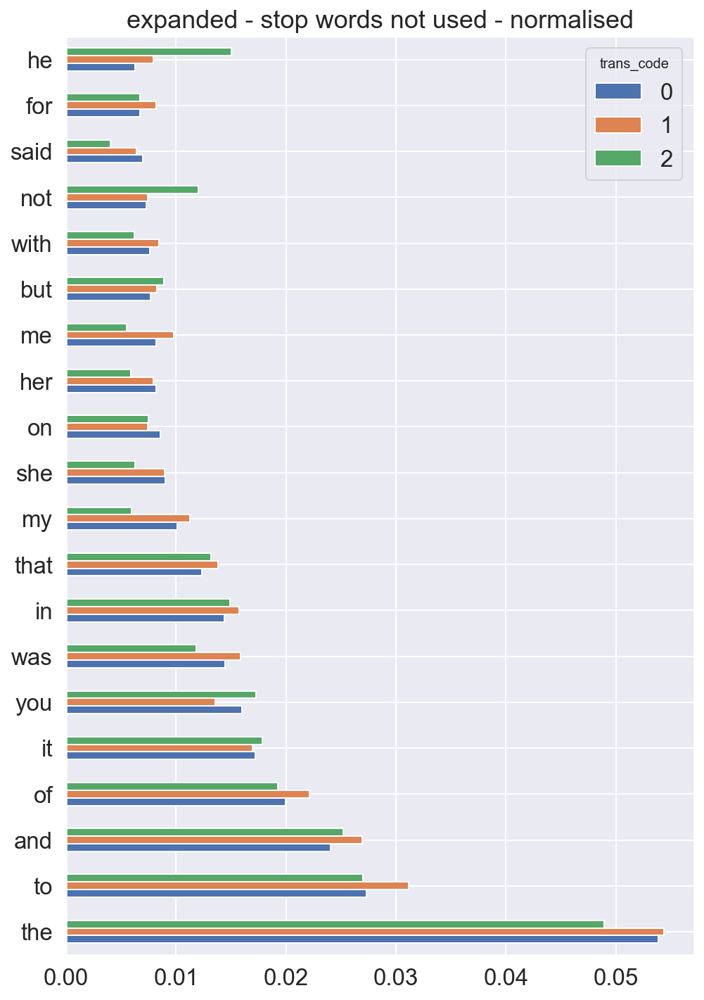

In [116]:
sub_df_norm.iloc[:,:20].T.plot(kind='barh', figsize=(8,12))
plt.title('expanded - stop words not used - normalised')
plt.show()

In [117]:
sub_df2 = df_bow_ex_stop.join(df['trans_code']).groupby('trans_code').sum().sort_values(by=0, ascending=False, axis=1)

In [118]:
# find the normalized counts using total counts per translator
sub_df2_norm = sub_df2.div(trans_word_counts, axis=0)

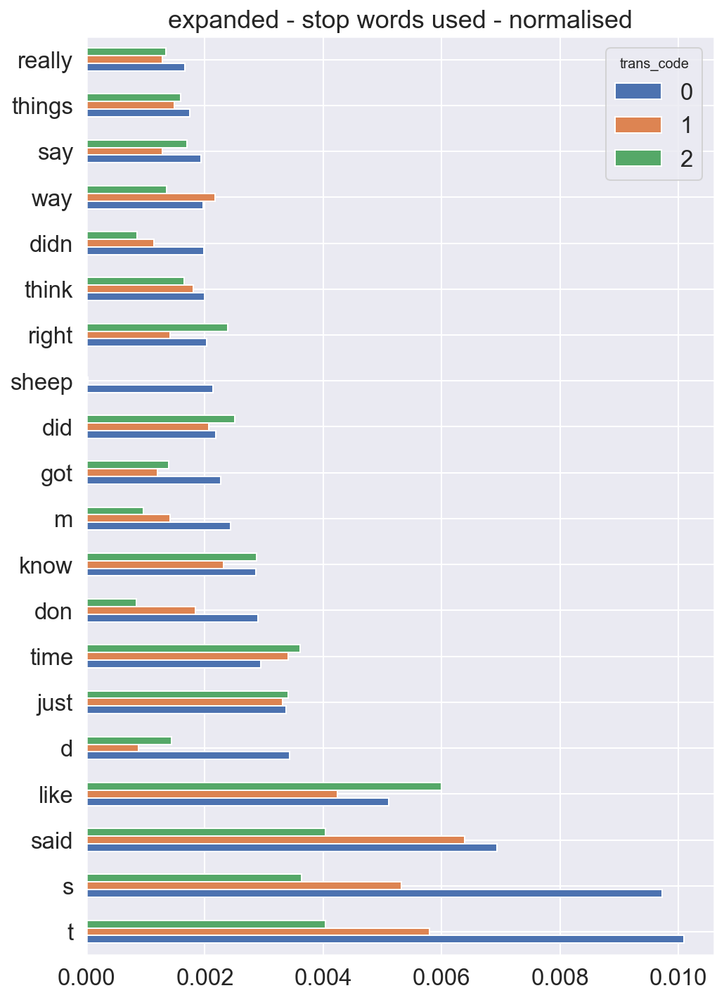

In [119]:
sub_df2_norm.iloc[:,:20].T.plot(kind='barh', figsize=(8,12))
plt.title('expanded - stop words used - normalised')
plt.show()

In [120]:
sub_df3 = df_bow_stop.join(df['trans_code']).groupby('trans_code').sum().sort_values(by=0, ascending=False, axis=1)

In [121]:
# find the normalized counts using total counts per translator
sub_df3_norm = sub_df3.div(trans_word_counts, axis=0)

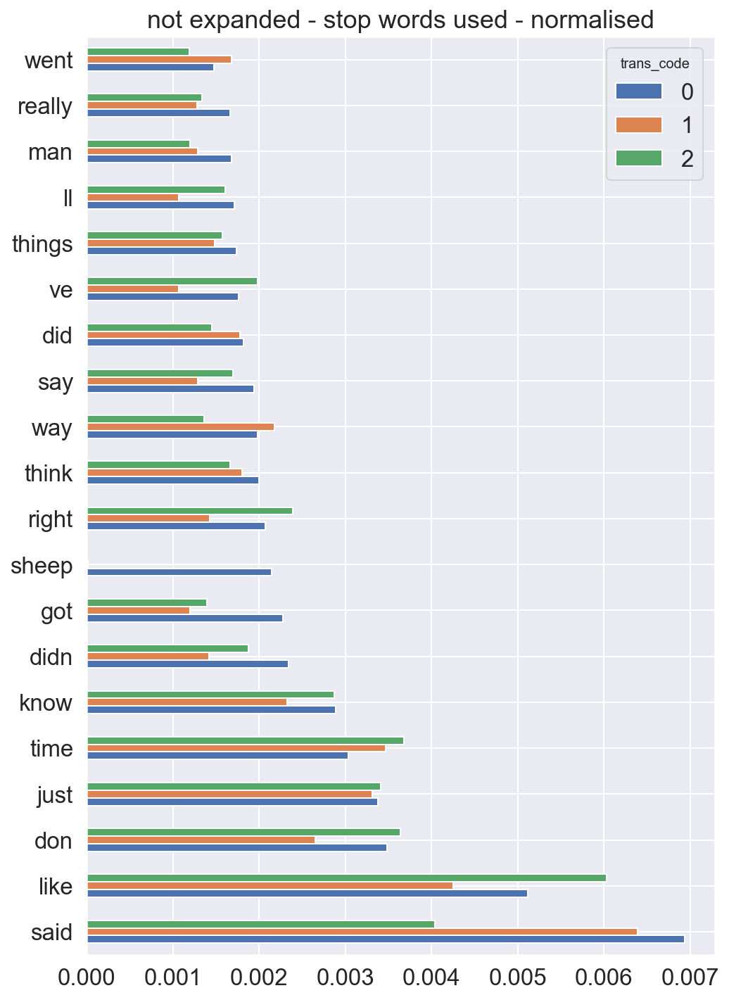

In [122]:
sub_df3_norm.iloc[:,:20].T.plot(kind='barh', figsize=(8,12))
plt.title('not expanded - stop words used - normalised')
plt.show()

In [64]:
# select top 100 then divide each by the total words for that author
# need to divide each total by the 

### Take aways
* without removing stopwords (the, to and, of, it etc.) are very common - can try a count of about 10 of these per chunk
* said, like, just, time, know and a few other words are quite common - can try counts of these as well
* need to look at the names in the text quite common - can perhaps look at count of types of word like name - may already be there
* could think about adding some common nouns, verbs, adjectives  etc which are not related to the story - may need to be careful here
